# Auxiliary tutorial 9a: Variational Bayes

(c) 2017 Heidi Klumpe. This work is licensed under a [Creative Commons Attribution License CC-BY 4.0](https://creativecommons.org/licenses/by/4.0/). All code contained therein is licensed under an [MIT license](https://opensource.org/licenses/MIT).

*This tutorial was generated from a Jupyter notebook.  You can download the notebook [here](aux9_var_bayes.ipynb).*


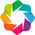

Loading BokehJS ...

In [1]:
import numpy as np
import pandas as pd
from time import time

# For inference
import pymc3 as pm
import theano.tensor as tt

# For plots
import bebi103
import holoviews as hv
hv.extension('bokeh')
import bokeh.io
import bokeh.plotting
bokeh.io.output_notebook()

import matplotlib.pyplot as plt
%matplotlib inline

## Why use Variational Bayes?

### We use Variational Bayes to analytically approximate posteriors.

For complex statistical models, it can be difficult to approximate the posterior with MCMC. Large data-sets, mathematical models including many variables, or hierarchical models require extensive sampling. **We can speed up this process if we instead derive an analytical *approximation* of the posterior.** Then, sampling becomes trivial. We call this process variational inference (VI).

### VI is sometimes (but not always) superior to MCMC.

In a [review](https://arxiv.org/abs/1601.00670) of VI by David Blei and others, they stress that MCMC and VI are "different approaches to solving the same problem." They are both attempts to approximate a posterior. MCMC approximates the posterior with the (biased) samples we draw from the posterior. VI approximates the posterior with an optimization problem.

**VI is preferred** when you need the approximate posterior faster than MCMC can produce with sufficient sampling. This is usually the case for very computationally intense MCMC problems, such as for large data sets or more complex models. Therefore, you might also prefer VI if you want to quickly compare several models.

**MCMC is preferred** when you have a smaller dataset and perhaps more confidence about which statistical model you will use. Also, *MCMC samples asymptotically approach the true posterior density, but VI does not.* Therefore, MCMC is preferred in instances where precision about the shape of the posterior is important, e.g. error bar estimation.

## How Variational Bayes works

### Kullback-Leibler divergence quantifies goodness of approximation.

As was stated without proof in [Auxiliary Tutorial 3](http://bebi103.caltech.edu.s3-website-us-east-1.amazonaws.com/2017/tutorials/aux3_dim_reduction.html), the Kullback-Leibler divergence is frequently used in information theory to quantify the dissimilarity between two probability distributions (note that it is not symmetric in the two distributions, and therefore cannot be considered a distance).

For VI, we want to approximate a posterior distribution $P(\theta \mid \mathbf{X})$ with an approximate distribution $Q(\theta)$. In this notation, $\theta$ represents a vector of parameters we might try to estimate (hereafter called latent, or unobserved, variables for clarity). $\mathbf{X}$ represents the data, or the observed variables. For a good approximation, we want the Kullback-Leibler divergence to be as small as possible. Note that we are departing from our notation of using $g$ to denote distributions of parameters and $f$ to denote distributions of data because the K-L divergence is general, and we will be using some joint distributions.

\begin{align}
D_{KL} \left(Q\middle\| P \right) = \sum_\theta Q(\theta)\, \ln \frac{Q(\theta)}{P(\theta \mid \mathbf{X})}.
\end{align}

(Note that this is zero if $Q \equiv P$, and positive otherwise.) However, because the full posterior appears in this expression, we would have to compute the evidence, $P(\mathbf{X}) = \int d\theta\, P(\theta, \mathbf{X})$, which is generally an intractable integral. Instead, we'd like the thing we optimize to be in terms of distributions that are more easily expressed, so we modify this expression. By the chain rule of probability,

\begin{align}
P(\theta \mid \mathbf{X}) = \frac{P(\theta, \mathbf{X})}{P(\mathbf{X})}.
\end{align}

We can substitute into our expression for $D_{KL}$ and rearrange using properties of logarithms.

\begin{align}
D_{KL} \left(Q\middle\| P \right) &= \sum_\theta Q(\theta) \, \ln \frac{Q(\theta)}{\frac{P(\theta, \mathbf{X})}{P(\mathbf{X})}}
\\[1em] &= \sum_\theta Q(\theta)\, \ln \frac{Q(\theta)}{P(\theta, \mathbf{X})} + \sum_\theta Q(\theta) \, \ln P(\mathbf{X})
\\[1em] &= \sum_\theta Q(\theta)\, \ln \frac{Q(\theta)}{P(\theta, \mathbf{X})} + \ln P(\mathbf{X})\sum_\theta Q(\theta) 
\\[1em] &= \sum_\theta Q(\theta)\, \ln \frac{Q(\theta)}{P(\theta, \mathbf{X})} + \ln P(\mathbf{X}).
\end{align}

Note that we effectively replaced the posterior (the conditional distribution $P(\theta \mid \mathbf{X})$) with the product of the likelihood and prior (the joint distribution $P(\theta, \mathbf{X}) = P(\mathbf{X} \mid \theta) P(\theta)$).

We further rearrange to get

\begin{align}
\ln P(\mathbf{X}) &= D_{KL} \left(Q\middle\| P \right) - \sum_\theta Q(\theta) \ln \frac{Q(\theta)}{P(\theta, \mathbf{X})}
\\ &= D_{KL} \left(Q\middle\| P \right) + \mathcal{L}\left(Q(\theta)\right),
\end{align}

where

\begin{align}
\mathcal{L}\left(Q(\theta)\right) = - \sum_\theta Q(\theta) \ln \frac{Q(\theta)}{P(\theta, \mathbf{X})}.
\end{align}

We see a few things in this result:<sup>1</sup>
* $\mathcal{L}(Q)$ is the log of the **evidence lower bound** (ELBO). That is because the the log evidence is guaranteed to be at least as big as $\mathcal{L}(Q)$.
* No matter what approximation we pick, $\log{P(\mathbf{X})}$ has the same value, i.e. it is a fixed constant for all possible choices of $Q(\theta)$. Therefore, making $\mathcal{L}(Q)$ large is equivalent ot making $D_{KL} \left(Q\middle\| P \right)$ small.
* We should choose $Q(\theta)$ such that $\mathcal{L}(Q)$ is **easy to compute and optimize, but not so simple that $Q(\theta)$ very poorly approximates the posterior.**

### VI should simplify calculations without making approximation meaningless.

We can choose any family of function to approximate our posterior, but it is particularly useful to choose the **mean-field variational family**. This assumes the latent variables of our stats model (i.e. the unobserved parameters we are trying to estimate) are independent, with their own unique parameters. Stated mathematically,

\begin{align}
Q(\theta) = \prod_i q_i (\theta_i ; \phi_i),
\end{align}

where $q_i$ are partitions of the approximation, each of which is an independent function of only one latent variable $\theta_i$, and $\phi_i$ are the unique parameters (e.g. mean, variance) governing $q_i$. The posterior in general does *not* factorize this way, which is what makes this an approximation.

To arrive at our final approximation, we need expressions for each $q_i$. For a given $q_i$, we want to estimate the posterior as a function of $\theta_i$ only. To do this, we replace all $\theta_{j\neq i}$ terms in the posterior with their expected values, i.e. $\theta_j^{mean} = \int d\theta_j q_j$. (That is why this is considered a mean field approach—you approximate the effect of other variables as a "mean field," rather than their true values. Note also that the mean is some constant, for which there is an analytical expression for most probability distributions.)

But now we see our final hurdle. To fully specify $q_i$, I need information about all the other partitions $q_{j\neq i}$, since the mean of that distribution may appear in the expression for $q_i$. Thus, to complete the optimization, we iteratively update $\phi_i$ for each latent variable $\theta_i$ (similar to Gibbs sampling), updating one variable at a time. We stop when we arrive at a solution (i.e. a set of $q_i$ and $\phi_i$) that maximizes the ELBO.

### Summary of VI algorithm

1. Our goal is to maximize the ELBO, which is equivalent to minimizing the dissimilarity between the posterior $P(\theta \mid \mathbf{X})$ and an approximate distribution $Q(\theta)$.
2. Posit that $Q(\theta) = \prod_i q_i(\theta_i; \phi_i)$. Note that you can derive what the functional form for $q_i$ should be<sup>2</sup> (e.g. Gaussian, Gamma, etc.), but PyMC3 will do it for you.<sup>3</sup> This defines the "restricted class" from which you find your best $Q(\theta)$ 
3. Vary $\phi_i$ to maximize the ELBO and find the best $Q(\theta)$. This gives the final form of approximation of the posterior, which you can then easily sample out of.

## A real example
For this tutorial, we'll use Matt Good's droplet data, which you can download [here](../data/2017/data/good_invitro_droplet_data.csv). In this experiment, the authors generated droplets of Xenopus extract of diameter $d$ and measured the length $l$ of the resulting spindle.

In [59]:
# Load in Data Frame
df = pd.read_csv('../data/good_invitro_droplet_data.csv', comment='#')

# Get Numpy arrays for speed
d = df['Droplet Diameter (um)'].values
ell = df['Spindle Length (um)'].values

### Example 1: Constant spindle length

For our first example, we will model the data as though spindle length were independent of droplet diameter.

#### Statistical model

As derived in [Tutorial 4a](t4a_parameter_estimation_by_optimization.html), we model this with Gaussian distributed error about some true spindle length $l_s$:

\begin{align}
l_s &\sim \mathrm{Uniform}(0,l_\mathrm{max})
\\[1em] \sigma &\sim \mathrm{Jeffreys}(0,\sigma_\mathrm{max})
\\[1em] l_i \mid l_s, \sigma &\sim \mathrm{Normal}(l_s, \sigma)\;\; \forall i
\end{align}

In [60]:
with pm.Model() as set_length_model:
    # Priors
    l_s = pm.Uniform('l_s', lower=0, upper=1000)
    sigma = bebi103.pm.Jeffreys('sigma', lower=0.1, upper=50)
    
    # Likelihood
    ell_obs = pm.Normal('ell_obs', mu=l_s, sd=sigma, observed=ell)

### Approximate the posterior: ADVI

ADVI stands for "Automatic Differentiation Variational Inference." It was developed [relatively recently](https://arxiv.org/abs/1603.00788) by [Alp Kucukelbir](http://www.proditus.com/). Rather than deriving by hand which family of functions $q_j$ are best to use for this statistical model, ADVI will compute those for us, as well as finding the parameters $\phi_j$ that give the closest approximation to the full posterior.

For this problem, our approximation ends up looking something like this:

\begin{align}
p(l_s, \sigma \mid \mathbf{l}) &\sim Q(l_s, \sigma; \phi)
\\ &\sim q_l(l_s; \phi_l) q_{\sigma}(\sigma; \phi_{\sigma})
\end{align}

Remember that when we use variational inference, we are doing an optimization problem. So first we find a "fit" for the posterior approximation, using ADVI.

In [61]:
# Specify parameters for inference
n_fit = 50000
n_sample = 40000

# ADVI
with set_length_model:
    advi = pm.ADVI()
    approx_fit = pm.fit(n_fit, method=advi)

Average Loss = 2,011.8: 100%|██████████| 50000/50000 [00:42<00:00, 1163.71it/s]  
Finished [100%]: Average Loss = 2,011.8
INFO:pymc3.variational.inference:Finished [100%]: Average Loss = 2,011.8


Because this is an optimization problem, we want to be sure we converged to a good approximation. Recall from above that, as we vary $\phi$ in $Q(l_s,\sigma; \phi)$ to get the closet approximation to the posterior $p(l_s,\sigma \mid \textbf{l}_i)$, we are minimizing the evidence lower bound (`ELBO`). This is equivalent to minimizing the Kullback-Leibler divergence between $Q(l_s,\sigma; \phi)$ and $p(l_s,\sigma \mid \textbf{l}_i)$. 

As we iterate over values of $\phi$, we expect to the ELBO to increase and, in final iterations, change very little. We can check this by plotting the negative ELBO for each iteration.

In [62]:
p = bokeh.plotting.figure(plot_width=600,
                          plot_height=300,
                          y_axis_type='log',
                          x_axis_label='iteration',
                          y_axis_label='neg. ELBO')
p.line(np.arange(len(advi.hist)), advi.hist)
bokeh.io.show(p)

That looks pretty reasonable. We really did not need much more than 40,000 iterations to converge. Now we can take samples out of our approximate posterior, the same way we would with MCMC.

In [10]:
t0 = time()
with set_length_model: 
    advi_trace = approx_fit.sample(n_sample)
t_sample = time() - t0

# Print computation times
print('Sampling from the posterior approximation took {0:.3f}s.'.format(t_sample))

Sampling from the posterior approximation took 1.504s.


Note how fast that was! Now, let's do all the things we normally do with posteriors: plot, find the MAP, and compute the HPD.

In [11]:
g = bebi103.viz.corner(advi_trace,
                       vars=['l_s','sigma'],
                       plot_width=200)
bokeh.io.show(g)

This posterior looks pretty well-sampled, and roughly Gaussian in both variables. Now we compute the median and HPD.

In [23]:
# Make a dataframe with ADVI results
df_advi = bebi103.pm.trace_to_dataframe(advi_trace)
df_advi['method'] = 'ADVI'

# Compute for ADVI trace
ls_median = np.median(df_advi['l_s'])
sigma_median = np.median(df_advi['sigma'])

print("""ADVI
----
Spindle length (l_s, in µm):    {0:.2f}, [{1:.2f}, {2:.2f}]
Variance in length (σ, in µm):   {3:.2f}, [ {4:.2f},  {5:.2f}]
""".format(ls_median, *pm.hpd(df_advi['l_s']),
           sigma_median, *pm.hpd(df_advi['sigma'])))

ADVI
----
Spindle length (l_s, in µm):    32.82, [32.43, 33.22]
Variance in length (σ, in µm):   4.78, [ 4.50,  5.06]



We can compare this to the result we get from using MCMC, drawing the same number of samples (with 10,000 tune steps as well, and using two cores). First, we compute our samples.

In [18]:
n_draws = 20000
n_tunes = 10000

# Full MCMC
with set_length_model:
    trace = pm.sample(draws=n_draws, tune=n_tunes, njobs=2, init='adapt_diag')

Auto-assigning NUTS sampler...
INFO:pymc3:Auto-assigning NUTS sampler...
Initializing NUTS using adapt_diag...
INFO:pymc3:Initializing NUTS using adapt_diag...
100%|██████████| 30000/30000 [00:19<00:00, 1574.82it/s]


This took about 20 seconds, much longer than sampling out of the approximate posterior. (Of course, fitting the variational model took longer, but for complicated models, VI will be *much* faster overall.) Let's take a look at the corner plot.

In [19]:
g = bebi103.viz.corner(trace,
                     vars=['l_s','sigma'],
                     plot_width=200)

bokeh.io.show(g)

This looks visually similar to the posterior we got from our variational approximation, but we can also check by comparing the MAP values and HPD ranges.

In [22]:
# Make a dataframe with MCMC results
df_mcmc = bebi103.pm.trace_to_dataframe(trace)
df_mcmc['method'] = 'MCMC'

# Compute for MCMC trace
ls_median = np.median(df_mcmc['l_s'])
sigma_median = np.median(df_mcmc['sigma'])

print("""MCMC
----
Spindle length (l_s, in µm):    {0:.2f}, [{1:.2f}, {2:.2f}]
Variance in length (σ, in µm):   {3:.2f}, [ {4:.2f},  {5:.2f}]
""".format(ls_median, *pm.hpd(df_mcmc['l_s']),
           sigma_median, *pm.hpd(df_mcmc['sigma'])))

MCMC
----
Spindle length (l_s, in µm):    32.86, [32.50, 33.22]
Variance in length (σ, in µm):   4.79, [ 4.54,  5.05]



We see that the means and HPD of both posteriors (approximated by ADVI and fully computed by MCMC) are quite close! We can further visualize their similarity with an ECDF of our samples for $l_s$ and $\sigma$.

In [25]:
# Concatenate for tidy dataframe
df_cp = pd.concat((df_mcmc.loc[:,('l_s', 'sigma', 'method')],
                   df_advi.loc[:,('l_s', 'sigma', 'method')]))

# Make eCDFs
ls_plot = bebi103.viz.ecdf_collection(df_cp, 'method', 'l_s', x_axis_label='ls (µm)') 
sigma_plot = bebi103.viz.ecdf_collection(df_cp, 'method', 'sigma', x_axis_label='σ (µm)')

bokeh.io.show(bokeh.layouts.gridplot([ls_plot, sigma_plot], ncols=2))

This looks great! But when and how can our approximation of the posterior fail?

### Example 2: Conservation of tubulin

#### Mathematical model

Here we consider the model derived from conservation of tubulin mass

\begin{align}
\\ l(d; \gamma, \phi) \approx \frac{\gamma d}{ \left(1+\left(\frac{d}{\phi}\right)^3 \right) ^{\frac{1}{3}} },
\end{align}

where $d$ is droplet diameter, $l$ is spindle length, and $\gamma$ and $\phi$ summarize the products of many parameters that cannot be estimated independently. (*Note that this is different than the $\phi$ generically defined above to indicate the factors for each partition $q_i$ in our approximation of the posterior*).

In [26]:
# Specify mathematical model
def spindle_length(d, gamma, phi):
    """Spindle length as a function of droplet diameter."""
    return gamma * d / (1 + (d/phi)**3)**(1/3)

### Statistical Model

For a best estimate and error bar for $\gamma$ and $\phi$ conditioned on the data, we compute the posterior distribution. The full posterior is derived in [Tutorial 4a](t4a_parameter_estimation_by_optimization.html). 

\begin{align}
\gamma &\sim \mathrm{Uniform}(0,1)
\\[1em] \phi &\sim \mathrm{Jeffreys}(\phi_\mathrm{min}, \phi_\mathrm{max})
\\[1em] \sigma &\sim \mathrm{Jeffreys}(\sigma_\mathrm{min}, \sigma_\mathrm{max})
\\[1em] l_i \mid \gamma, \phi, \sigma &\sim \mathrm{Norm}(l(d_i; \gamma, \phi), \sigma) \;\;\forall i
\end{align}

We have assumed the data are independent, and that errors (difference between math model prediction $l(d_i; \gamma, \phi)$ and observed $l_i$) are Normally distributed, with the same variance $\sigma^2$ for the error on each measurement. We take a Uniform prior on $\gamma$, and Jeffreys prior on our shape parameters $\phi$ and $\sigma$.

### Approximating the posterior

As before, we will compare the empirical posterior generated by MCMC sampling with the variational approximation of the posterior. 

For each of these, we start by specifying our model in pymc3.

In [27]:
with pm.Model() as model:
    # Priors
    gamma = pm.Uniform('gamma', lower=0, upper=1)
    log_phi = pm.Flat('log_phi')
    log_sigma = pm.Flat('log_sigma')

    # Convert logs (this gives Jeffreys priors)
    phi = pm.Deterministic('phi', tt.exp(log_phi))
    sigma = pm.Deterministic('sigma', tt.exp(log_sigma))

    # Compute spindle length
    ell_theor = spindle_length(d, gamma, phi)

    # Likelihood
    ell_obs = pm.Normal('ell_obs', mu=ell_theor, sd=sigma, observed=ell)

Use ADVI to find the best fit for the posterior approximation (`approx_fit`). Then draw 40,000 samples.

In [36]:
# Specify parameters for inference
n_fit = 100000
n_sample = 40000

# ADVI
with model:
    advi = pm.ADVI()
    approx_fit = pm.fit(n_fit, method=advi)
    
with model: 
    advi_trace = approx_fit.sample(n_sample)

Average Loss = 1,848.8: 100%|██████████| 100000/100000 [01:37<00:00, 1021.49it/s]
Finished [100%]: Average Loss = 1,848.8
INFO:pymc3.variational.inference:Finished [100%]: Average Loss = 1,848.8


Let's also use MCMC to generate our empirical approximation of the posterior.

In [31]:
n_draws = 20000
n_tunes = 10000

# Full MCMC
with model:
    trace = pm.sample(draws=n_draws, tune=n_tunes, njobs=2, init='adapt_diag')

Auto-assigning NUTS sampler...
INFO:pymc3:Auto-assigning NUTS sampler...
Initializing NUTS using adapt_diag...
INFO:pymc3:Initializing NUTS using adapt_diag...
100%|██████████| 30000/30000 [01:31<00:00, 326.99it/s]


As before, we see that sampling out of our variational approxiamtion is much faster than sampling with MCMC, though it does take longer to fit the model with ADVI.

Let's compare the results as before! First, we can look at plots of the posteriors.

In [37]:
g1 = bebi103.viz.corner(advi_trace,
                     vars=['gamma','phi','sigma'],
                     plot_width=200)

g2 = bebi103.viz.corner(trace,
                       vars=['gamma', 'phi', 'sigma'],
                       plot_width=200)

bokeh.io.show(g1)
bokeh.io.show(g2)

Wow, we see that ADVI does a poor job capturing the true variance of $\phi$ and $\gamma$, largely because our "mean field approximation" makes all parameters independent in our approximation of the posterior.

To visualize this further, we can look at ECDFs for parameter samples generated by these two techniques.

In [38]:
# Make a dataframe of results
df_mcmc = bebi103.pm.trace_to_dataframe(trace)
df_mcmc['method'] = 'MCMC'
df_advi = bebi103.pm.trace_to_dataframe(advi_trace)
df_advi['method'] = 'ADVI'

# Concatenate for tidy dataframe
df_cp = pd.concat((df_mcmc.loc[:,('gamma','sigma','phi','method')],
                   df_advi.loc[:,('gamma','sigma','phi','method')]))

# Make eCDFs
gamma_plot = bebi103.viz.ecdf_collection(df_cp, 'method','gamma') 
phi_plot = bebi103.viz.ecdf_collection(df_cp, 'method','phi')
sigma_plot = bebi103.viz.ecdf_collection(df_cp, 'method','sigma')

bokeh.io.show(bokeh.layouts.gridplot([gamma_plot, phi_plot, sigma_plot], ncols=2))

This is a general result for the variational approximation compared to the true posterior: **the means are the same, but VI can significantly underestimate the variance**. We see this also when we compute the medians and HPD.

In [42]:
# Compute for ADVI trace
gamma_median = np.median(df_advi['gamma'])
phi_median = np.median(df_advi['phi'])
sigma_median = np.median(df_advi['sigma'])

print("""ADVI
----
gamma:       {0:.2f}, [ {1:.2f},  {2:.2f}]
phi (µm):   {3:.2f}, [{4:.2f}, {5:.2f}]
sigma (µm):  {6:.2f}, [ {7:.2f},  {8:.2f}]
""".format(gamma_median, *pm.hpd(df_advi['gamma']),
           phi_median, *pm.hpd(df_advi['phi']),
           sigma_median, *pm.hpd(df_advi['sigma'])))

# Compute for MCMC trace
gamma_median = np.median(df_mcmc['gamma'])
phi_median = np.median(df_mcmc['phi'])
sigma_median = np.median(df_mcmc['sigma'])

print("""
MCMC
----
gamma:       {0:.2f}, [ {1:.2f},  {2:.2f}]
phi (µm):   {3:.2f}, [{4:.2f}, {5:.2f}]
sigma (µm):  {6:.2f}, [ {7:.2f},  {8:.2f}]
""".format(gamma_median, *pm.hpd(df_mcmc['gamma']),
           phi_median, *pm.hpd(df_mcmc['phi']),
           sigma_median, *pm.hpd(df_mcmc['sigma'])))

ADVI
----
gamma:       0.86, [ 0.85,  0.87]
phi (µm):   44.48, [43.86, 45.08]
sigma (µm):  3.77, [ 3.55,  3.99]


MCMC
----
gamma:       0.86, [ 0.83,  0.90]
phi (µm):   44.41, [41.89, 46.98]
sigma (µm):  3.76, [ 3.56,  3.97]



A final note of interest - since ADVI approximates the mean really well, but not so much the structure of the posterior, PyMC3 uses both ADVI and MCMC when initializing with `advi+adapt_diag`. First, it uses ADVI to approximate the posterior and find the MAP (or close to it). Then, it starts the walkers for full MCMC near the MAP predicted by ADVI.

### Exercise 3: Does the ADVI fit have to be slow?

We started this enterprise hoping that VI would be much faster than MCMC. In fact, fitting the distribution takes longer than all our MCMC sampling in our example. So, for fun, let's see what happens if we run the fit optimization for fewer steps.

In [ ]:
# Specify parameters for inference
n_fits = np.array([1000,5000,10000, 50000, 100000])
n_sample = 40000

# Initialize to store outputs
df_advi_fit = pd.DataFrame()
final_elbo = np.zeros(len(n_fits))
t_fit_all = np.zeros(len(n_fits))
gamma_median = np.zeros(len(n_fits))
gamma_hpd = np.zeros(np.array([len(n_fits),2]))

with model: 
    # Loop over different numbers of fit steps.
    for i, fit_steps in enumerate(n_fits):

        # Fit with ADVI
        t0 = time()
        advi = pm.ADVI()
        approx_fit = pm.fit(fit_steps, method=advi)
        t_fit = time() - t0

        # Compute samples
        t0 = time()
        advi_trace = approx_fit.sample(n_sample)
        t_sample = time() - t0
        
        # Export trace to dataframe
        df_i = bebi103.pm.trace_to_dataframe(advi_trace)
        df_i['n_steps'] = fit_steps
        
        # Store results in summary data frame
        df_advi_fit = pd.concat((df_advi_fit, df_i))
        
        # Store information about each fit
        final_elbo[i] = -advi.hist[-1]
        t_fit_all[i] = t_fit
        gamma_median[i] = np.median(df_i['gamma'])
        gamma_hpd[i,:] = [*pm.hpd(df_i['gamma'])]

Average Loss = 7.5857e+05: 100%|██████████| 1000/1000 [00:00<00:00, 1099.94it/s]
Finished [100%]: Average Loss = 7.5599e+05
INFO:pymc3.variational.inference:Finished [100%]: Average Loss = 7.5599e+05
Average Loss = 67,462: 100%|██████████| 5000/5000 [00:04<00:00, 1150.28it/s]    
Finished [100%]: Average Loss = 67,262
INFO:pymc3.variational.inference:Finished [100%]: Average Loss = 67,262
Average Loss = 4,970.9: 100%|██████████| 10000/10000 [00:08<00:00, 1136.24it/s]  
Finished [100%]: Average Loss = 4,965.5
INFO:pymc3.variational.inference:Finished [100%]: Average Loss = 4,965.5


First, we're interested in how changing the number of fit steps changes the final ELBO (which should show how close we are to the "best" approximation) and how much time it took to fit the approximation.

In [69]:
p1 = bokeh.plotting.figure(plot_height=250,
                           plot_width=450, 
                           x_axis_label='number of fit steps',
                           y_axis_label='-(final ELBO)',
                           x_axis_type='log',
                           y_axis_type='log')
p1.circle(n_fits, -final_elbo)

p2 = bokeh.plotting.figure(plot_height=250,
                           plot_width=450, 
                           x_axis_label='number of fit steps',
                           y_axis_label='computation time (s)',
                           x_axis_type='log',
                           y_axis_type='log')
p2.circle(n_fits, t_fit_all)

p1.x_range = p2.x_range

bokeh.io.show(bokeh.layouts.gridplot([p1, p2], ncols=1))

As expected, ELBO increases as we take more steps, as does the time of computation. I've also plotted the log of the negative ELBO, to get a sense of how much the ELBO is changing. Up to 50,000 fitting steps, there seems to be meaningful change. Let's see how much these changes in ELBO affect our estimate of $\gamma$.

In [72]:
gamma_plot = bebi103.viz.ecdf_collection(df_advi_fit,
                                         'n_steps',
                                         'gamma',
                                         order=n_fits,
                                         palette=bokeh.palettes.Category10_7,
                                         plot_width=700,
                                         title='Effect of fit optimization on gamma HPD')

gamma_plot.legend.location = 'top_left'

bokeh.io.show(gamma_plot)

As the number of fitting steps increases to 10,000, the estimate of the mean gets closer to the 0.86, the most likely value of $\gamma$ according to our MCMC results. However, further optimization doesn't change the mean much, but the HPD gets narrower. Note that even though we know the true variance is larger, this narrower fit is still "better," by our definition of $D_{KL}$.

So, it can be hard to intuit, looking at the ELBO trace alone, when we've converged on a "good enough" approximation. However, if we want an accurate estimate of the mean, we achieved that at about 10,000 steps, which took only 20s and is faster than full MCMC sampling.

# Summary

**Goal**: Find the "best" approximation $Q(\theta)$ of the posterior distribution $P(\theta \mid \textbf{x})$. 

**Approach:**
* Minimize the Kullback-Leilber divergence between $P(\theta \mid \textbf{x})$ and $Q(\theta)$ to find the "best" fit.
* To make the search for the "best" approximation tractable, pick a family of functions for $Q(\theta)$ that make optimization easy, but are complex enough to capture relevant features of posterior.
* We nearly always use a "mean field variational family." This means we assume the approximation factorizes (i.e. each parameter is influenced only by a "mean field" of the other parameters). Mathematically, this means $\theta$: $Q(\theta) = \prod_j q_j (\theta_j)$.

**Resulting Features:**
* When using variational inference (VI), inference is an optimization problem, rather than a sampling problem.
* VI is faster than MCMC (i.e. returns a posterior approximation more quickly), but will not converge to the final posterior distribution. Rather, it gets as close as it can, given the constraints of the approximating functions $q_j$.
* In particular, VI will underestimate the variance of $\theta_j$, and capture no covariance.
* ADVI automatically fits the best posterior approximation. You can use it to initializate your walkers for full MCMC.

# Further Reading
Useful introductions: 
* Blei, *et al.* ["Variational Inference: A Review for Statisticians."](https://arxiv.org/abs/1601.00670) arXiv, 2017.
* ["Variational Bayesian Methods"](https://en.wikipedia.org/wiki/Variational_Bayesian_methods) on wikipedia.

Books with chapters on variational methods:
* Section 13.7. "Variational inference." *Bayesian Data Analysis.* Gelman *et al.*, 2014.
* Chapter 33. "Variational Methods." *Information Theory, Inference, and Learning Algorithms.* MacKay, 2012.


Related topics:
* Kucukelbir, *et al.* ["Automatic Differentiation Variational Inference."](https://arxiv.org/abs/1603.00788). arXiv, 2016.
* [ADVI docs](http://docs.pymc.io/notebooks/bayesian_neural_network_advi.html) applied to a neural network.

# Footnotes

<sup>1</sup>$\mathcal{L}(Q)$ is also sometimes called the "negative variational free energy." This is because it has the form of a free energy, summing up an expected value for the energy and the entropy. 

\begin{align}
\\ \mathcal{L}(Q) &= -\sum_\theta Q(\theta) \mathrm{log} \frac{Q(\theta)}{P(\theta, \mathbf{X})}
\\ &= \sum_\theta Q(\theta) \left[ \mathrm{log} P(\theta, \mathbf{X}) - \mathrm{log} {Q(\theta)} \right]
\\ &= \sum_\theta Q(\theta) \mathrm{log} P(\theta, \mathbf{X}) - \sum_\theta Q(\theta)\mathrm{log} Q(\theta)
\end{align}

The first term approximates an expected value for the "energy", and the second closely resembles the definition of the Shannon entropy.

<sup>2</sup> To find the functional form of $q_i$, you want to approximate the posterior as a function of only one latent variable $\theta_i$. You can set $\log{q_i}$ equal to the expectation of the log posterior density, considering it as a function of $\theta_i$ only and computing the expectation value (i.e. averaging) over all other distribtuions $q_{j\neq i}$. (Note that the log $P(\theta, \mathbf{X})$ density agrees with the log posterior density to within a constant, so you need only know the log $P(\theta, \mathbf{X})$ density, i.e. the likelihood and prior.) 

Because of the independence of each $q_i$, most terms in the log posterior density factorize. Any terms not including $\theta_i$ are ignored as constants. The remaining terms ($\theta_i$ and expectation values for other latent variables $\theta_{j\neq i}$) tell you the form of $q_i$. For example, if $\log{q_i} \sim f(\theta_i^2)$, then we expect $q_i$ to be Gaussian. If  $\log{q_i} \sim f(\theta_i^2 + \mathrm{exp}(\theta_i))$, then we expect $q_i$ to be a Gamma distribution. 

All the other neglected constants and factors (such as $\mu$ and $\sigma$ for the Gaussian, or $a$ and $b$ for the Gamma) are computed iteratively in the third step of the algorithm, where you find $\phi_i$ to maximize the ELBO. As described above, they will depend on the expected values of the other distributions.

This is worked out explicitly in the [Wikipedia article](https://en.wikipedia.org/wiki/Variational_Bayesian_methods), which I found useful for gaining intuition.

<sup>3</sup> ADVI actually assumes each $q_i$ is a Gaussian, but in a transformed variable space. According to [Kucukelbir's paper](https://arxiv.org/abs/1603.00788), this implicitly allows non-Gaussian variational distributions in the original variable space.